Catherine Carmosino

11/18/2025

# Loading in Data

In [3]:
#loading in the libraries
import hisepy
import numpy as np
import scanpy as sc
import anndata as ad
import pandas as pd


## Read in .h5ad files in our File Set

In [4]:
h5ad_files = hisepy.cache_fileset('f48bf688-1a5f-456c-b0b0-c6ec870ec003')

In [5]:
# view the first five file names
h5ad_files[0:5]

['/home/workspace/input/1784782472/fileset/f48bf688-1a5f-456c-b0b0-c6ec870ec003/rhodium-niobium-silver/Afatinib_BIBW2992_counts_filtered_labeled_sampled.h5ad',
 '/home/workspace/input/1784782472/fileset/f48bf688-1a5f-456c-b0b0-c6ec870ec003/rhodium-niobium-silver/Afatinib_dimaleate_counts_filtered_labeled_sampled.h5ad',
 '/home/workspace/input/1784782472/fileset/f48bf688-1a5f-456c-b0b0-c6ec870ec003/rhodium-niobium-silver/Baricitinib_LY3009104_INCB028050_counts_filtered_labeled_sampled.h5ad',
 '/home/workspace/input/1784782472/fileset/f48bf688-1a5f-456c-b0b0-c6ec870ec003/rhodium-niobium-silver/Baricitinib_phosphate_counts_filtered_labeled_sampled.h5ad',
 '/home/workspace/input/1784782472/fileset/f48bf688-1a5f-456c-b0b0-c6ec870ec003/rhodium-niobium-silver/Canertinib_CI-1033_counts_filtered_labeled_sampled.h5ad']

In [6]:
#initialize a list
adata_list = []

#iterate over the list h5ad_files
for h5ad_file in h5ad_files:
    #use Scanpy to read the file
    adata = sc.read_h5ad(h5ad_file)
    #append anndata file object into the list
    adata_list.append(adata)

In [7]:
#view the first item of the list
adata_list[0]

AnnData object with n_obs × n_vars = 25000 × 1916
    obs: 'original_barcodes', 'batch_id', 'pool_id', 'chip_id', 'well_id', 'n_umis', 'n_genes', 'plate_location', 'cyto_treatment', 'drug_treatment', 'drug_name', 'drug_cas_number', 'drug_mw', 'drug_solvent', 'drug_pathway', 'drug_target', 'drug_description', 'drug_chembl_name', 'drug_chembl_id', 'AIFI_L1', 'AIFI_L2', 'leiden_2'
    uns: 'drug_name_colors', 'leiden_2', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [7]:
#using anndata to concatenate: code chunk from Scanpy tutorial

#combine multiple anndata objects and adds a "sample" column telling you which dataset each cell came from; aka, which DRUG NAME each cell was treated with!
adata = ad.concat(adata_list, label="sample")

#make sure all observations are unique
adata.obs_names_make_unique()

#filtering out CD8aa because there aren't enough
adata = adata[adata.obs.AIFI_L2 != "CD8aa"]

/home/workspace/environment/pythonscrna12/lib/python3.13/site-packages/anndata/_core/merge.py:1667: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  concat_annot = pd.concat(


## Normalization

In [8]:
# help(adata)
adata.layers["counts"] = adata.X.copy()

# Normalizing to median total counts
sc.pp.normalize_total(adata, target_sum = 1e4)


adata.layers["log_transformed"] = np.log1p(adata.X)
#Logarithmize the data
sc.pp.log1p(adata)

# sc.pp.scale(adata)

/tmp/ipykernel_601/2484383644.py:2: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy()


## Start of DEG

Have divide by zero errors when using the wilcoxon method.

In [9]:
# making a dictionary of subsetted data where the key is the cell type and the value is the anndata object
subsets_cells = {}

for cell_type in adata.obs['AIFI_L2'].unique():
    # print(f'current cell type is {cell_type}')
    cell_type_subset = adata[adata.obs.AIFI_L2 == cell_type].copy()
    #running the rank gene groups
    sc.tl.rank_genes_groups(
        adata = cell_type_subset,
        groupby = "drug_name",
        reference = "DMSO Control",
        method = "wilcoxon",
        layer = "log_transformed"
    )
    subsets_cells[cell_type] = cell_type_subset

# print(subsets_cells)

# figure out grabbing the data frames from these -- adata.to_df()

# get_rank

CD4 Central Memory
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


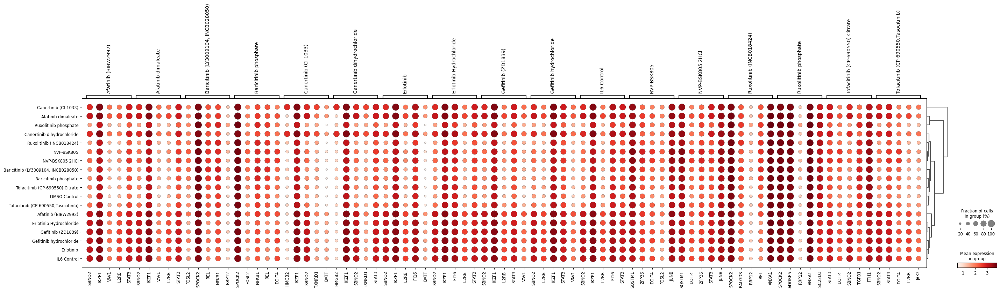

CD8 Naive
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


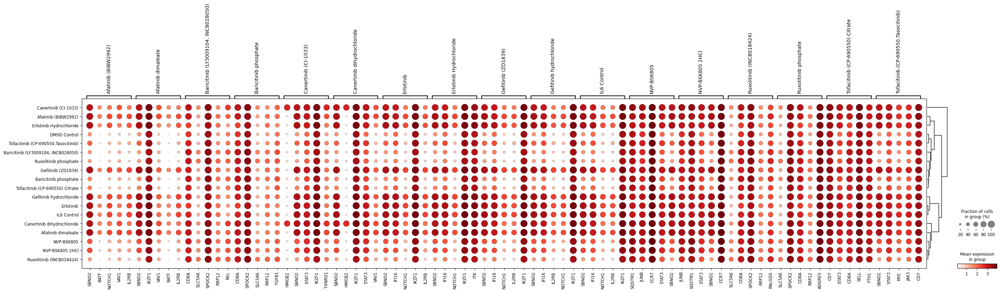

CD8 Effector Memory
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


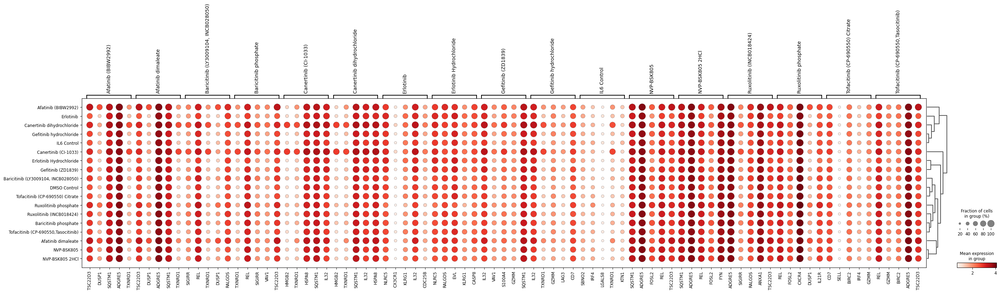

CD8 Central Memory
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


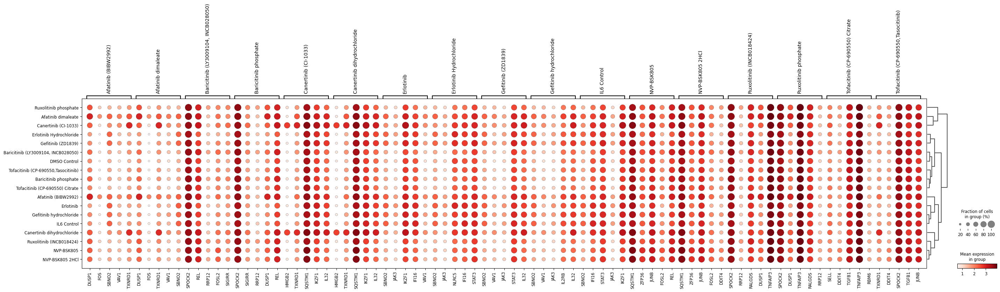

CD4 Naive
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


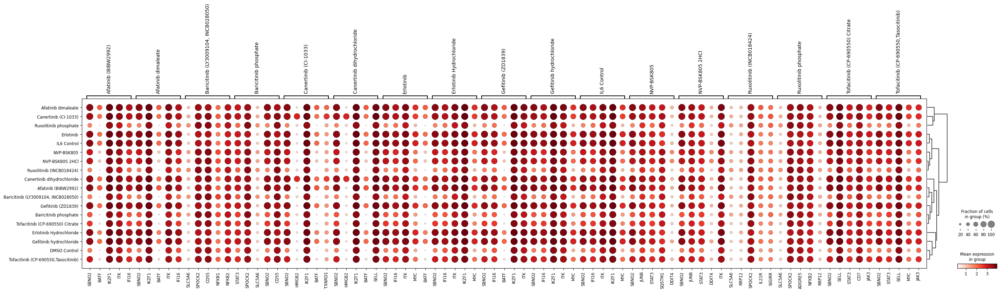

CD4 Effector Memory
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


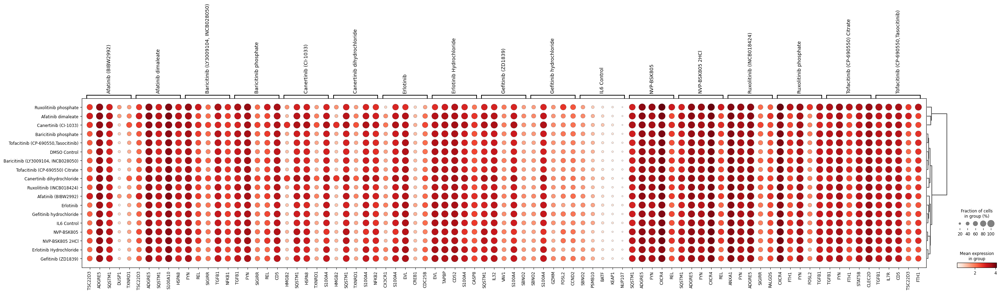

MAIT
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


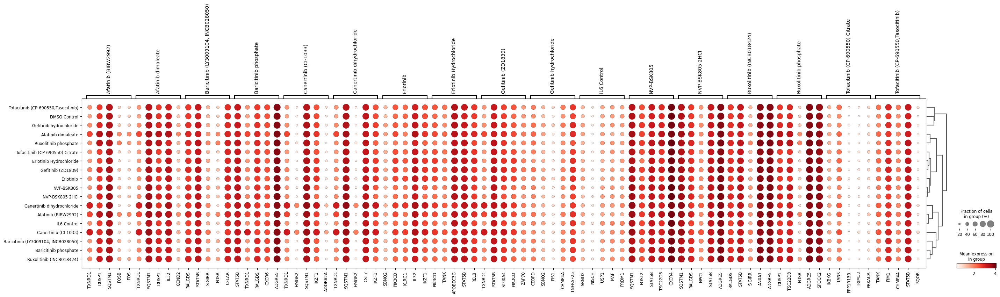

Treg
categories: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.
var_group_labels: Afatinib (BIBW2992), Afatinib dimaleate, Baricitinib (LY3009104, INCB028050), etc.


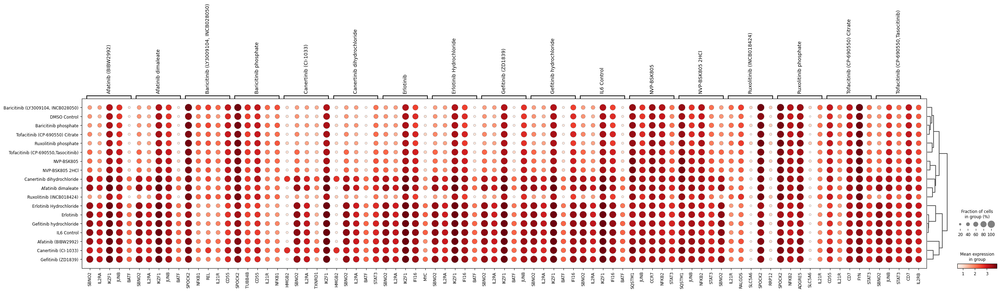

In [18]:
for cell_type, subset_cell in subsets_cells.items():    
    print(cell_type)
    sc.pl.rank_genes_groups_dotplot(subset_cell, groupby="drug_name", n_genes=5)

Check scanpy preprocessing filter genes -- dropped in the slack
- min cells (>0)
- min counts

In [13]:
#these steps were done above!
#rescaling each cell to a specific library size
#sc.pp.normalize_total(adata, target_sum = 1e4)
#applying a log-transform to the data
#sc.pp.log1p(adata)

#running highly variable genes
#sc.pp.highly_variable_genes(adata, min_mean=0.0125, min_disp=0.1, batch_key="drug_name")
sc.pp.highly_variable_genes(adata, n_top_genes=50, batch_key="drug_name")

#get the names of highly variable genes
highly_variable_gene_names = adata.var_names[adata.var['highly_variable']].tolist()

print(f"Number of highly variable genes: {len(highly_variable_gene_names)}")
print(highly_variable_gene_names[:10])

Number of highly variable genes: 50
['IKZF2', 'CDH1', 'TNFRSF9', 'FOXP3', 'YBX3', 'CST7', 'RGS1', 'GZMB', 'NKG7', 'KLRB1']


## Heatmap

CD4 Central Memory


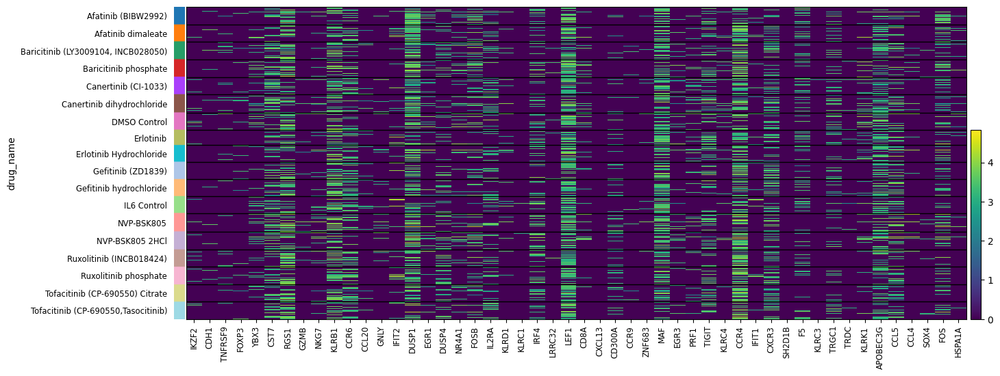

CD8 Naive


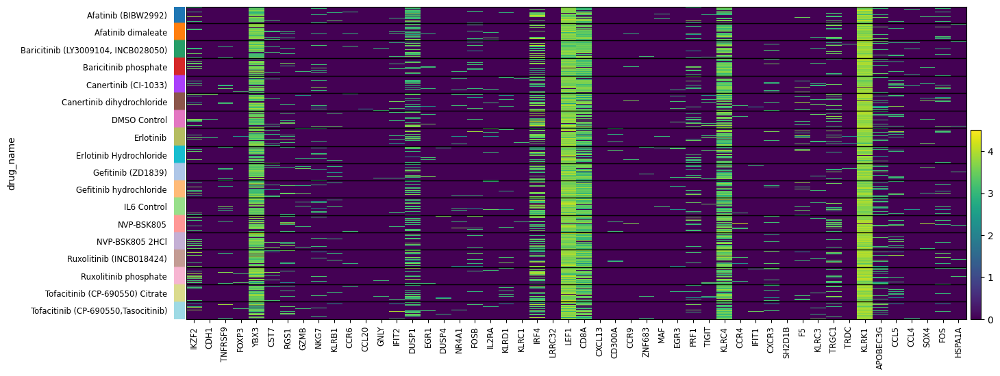

CD8 Effector Memory


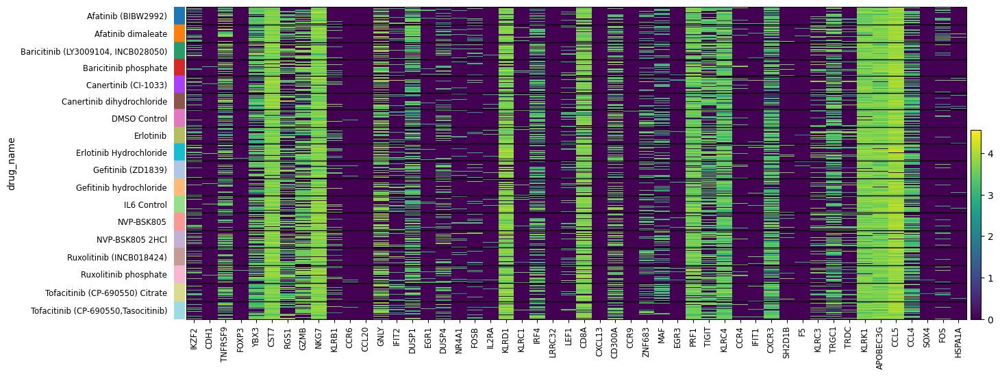

CD8 Central Memory


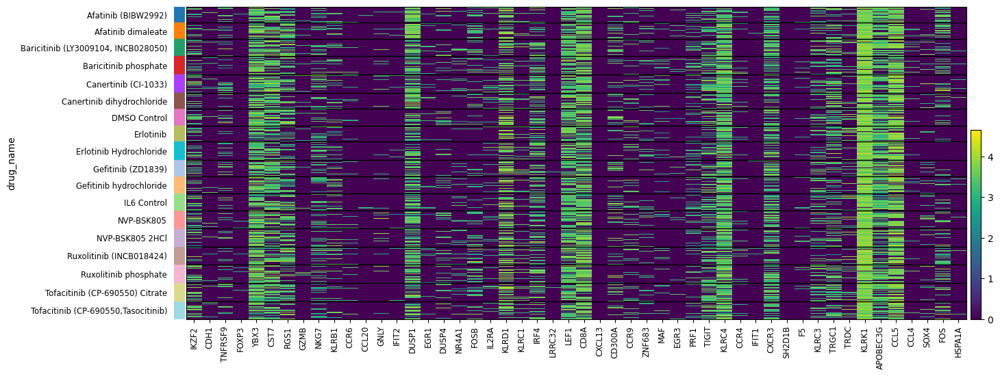

CD4 Naive


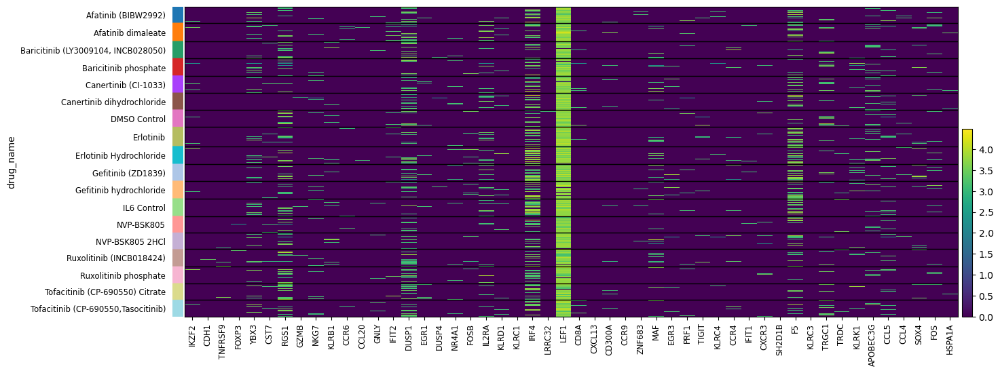

CD4 Effector Memory


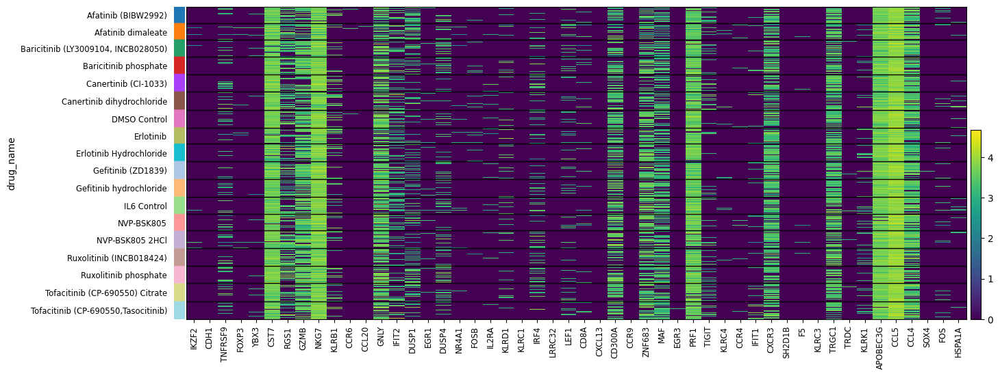

MAIT


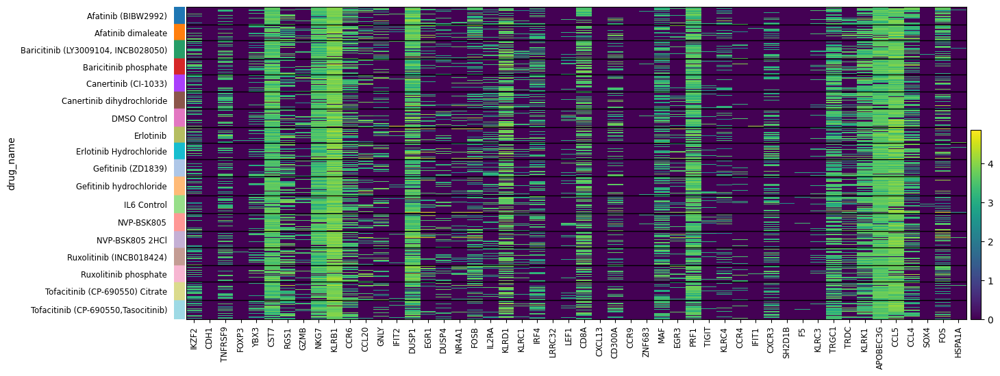

Treg


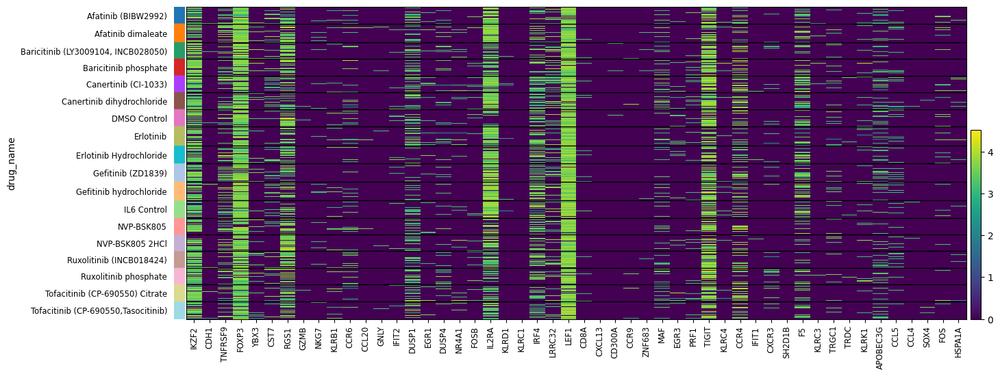

In [39]:
for cell_type, subset_cell in subsets_cells.items():    
    print(cell_type)
    sc.pl.heatmap(subset_cell, highly_variable_gene_names, groupby="drug_name", cmap="viridis", dendrogram=False)

## Matrixplot

CD4 Central Memory


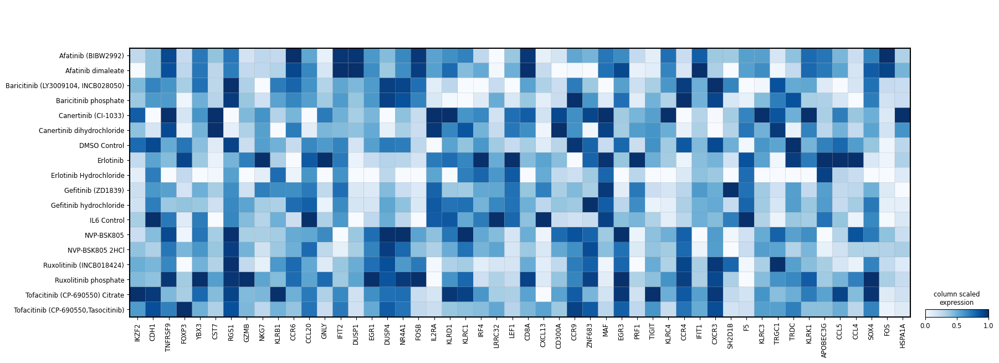

CD8 Naive


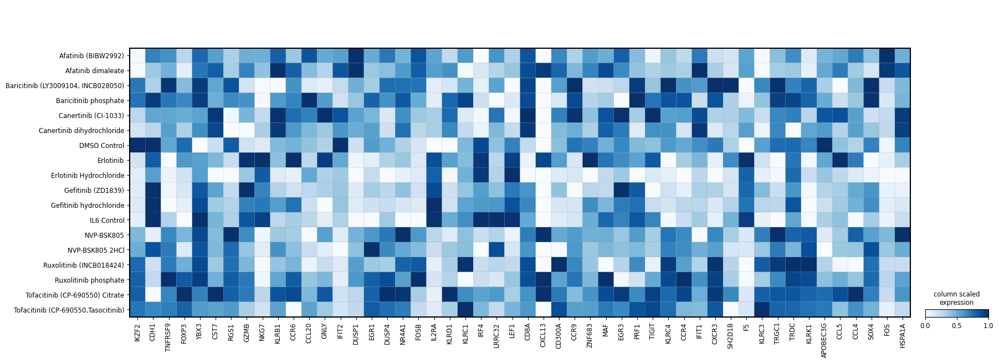

CD8 Effector Memory


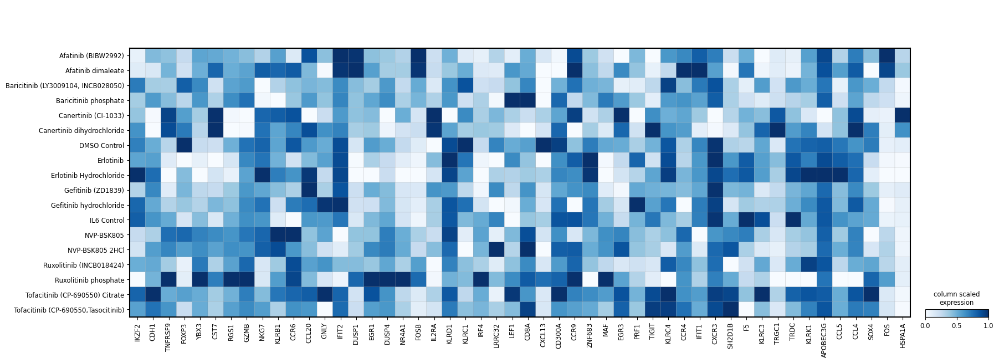

CD8 Central Memory


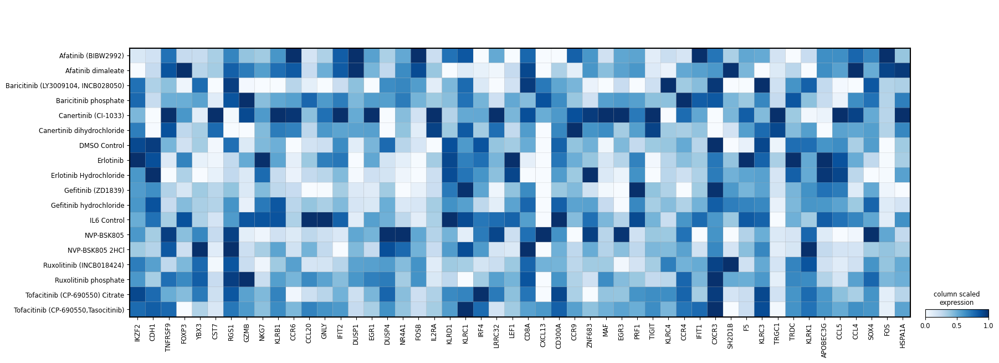

CD4 Naive


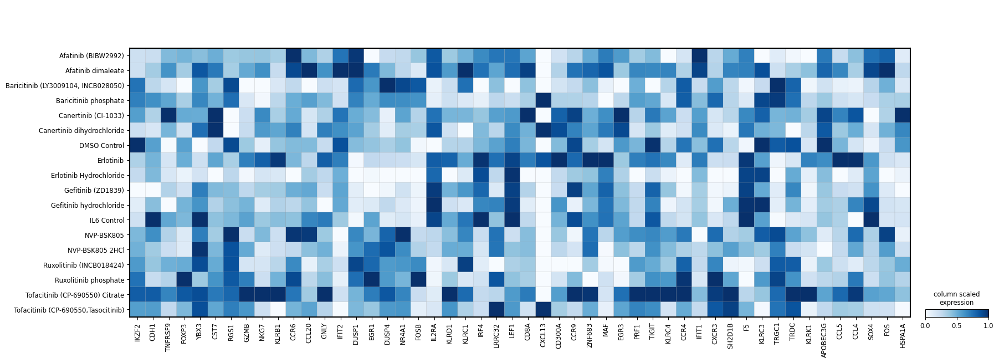

CD4 Effector Memory


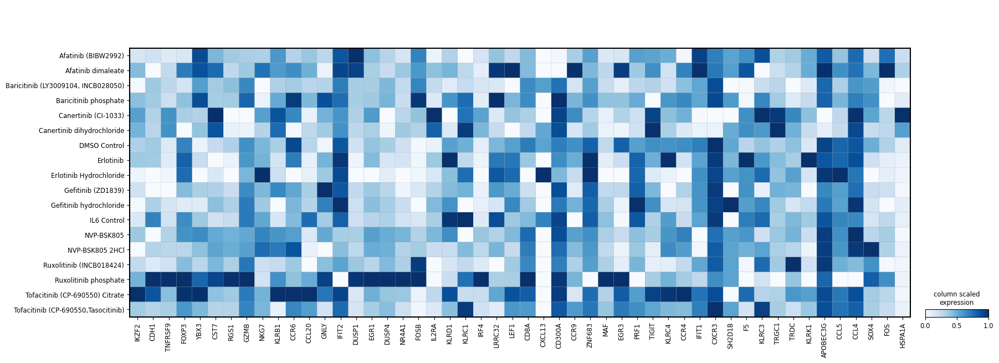

MAIT


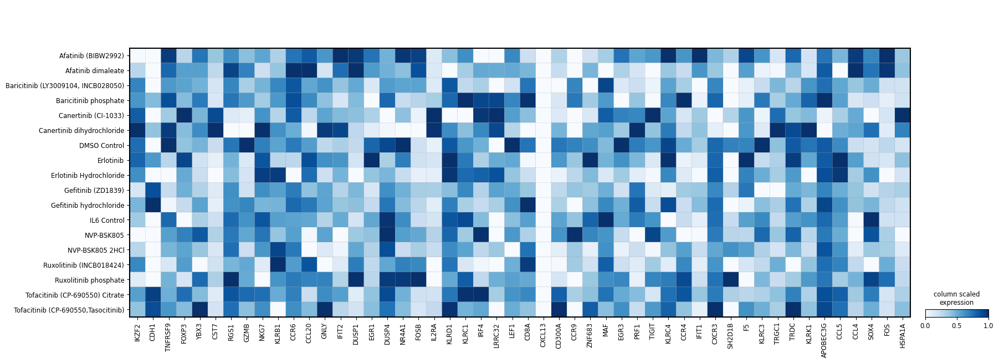

Treg


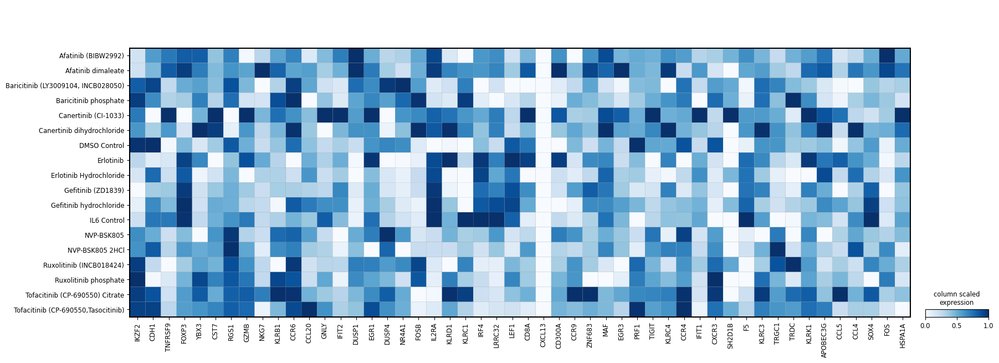

In [41]:

for cell_type, subset_cell in subsets_cells.items():    
    print(cell_type)
    sc.pl.matrixplot(
        subset_cell,
        var_names = highly_variable_gene_names,
        groupby = "drug_name",
        dendrogram=False,
        cmap="Blues",
        standard_scale="var",
        colorbar_title="column scaled\nexpression",
    )


## Heatmap for marker genes 

CD4 Central Memory
CD8 Naive
CD8 Effector Memory
CD8 Central Memory
CD4 Naive
CD4 Effector Memory
MAIT
Treg


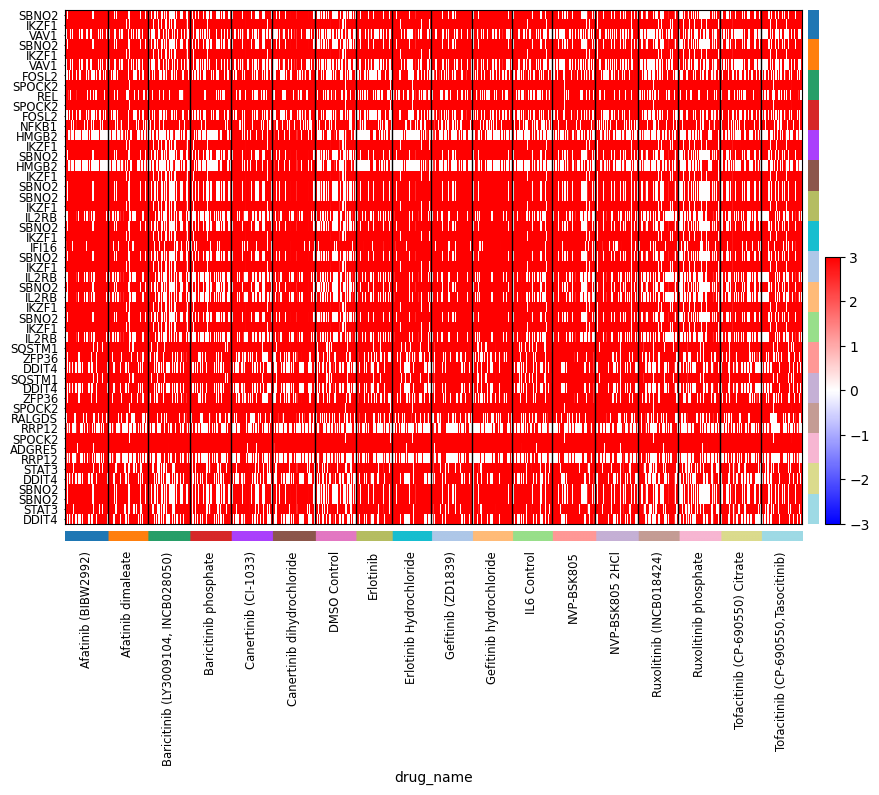

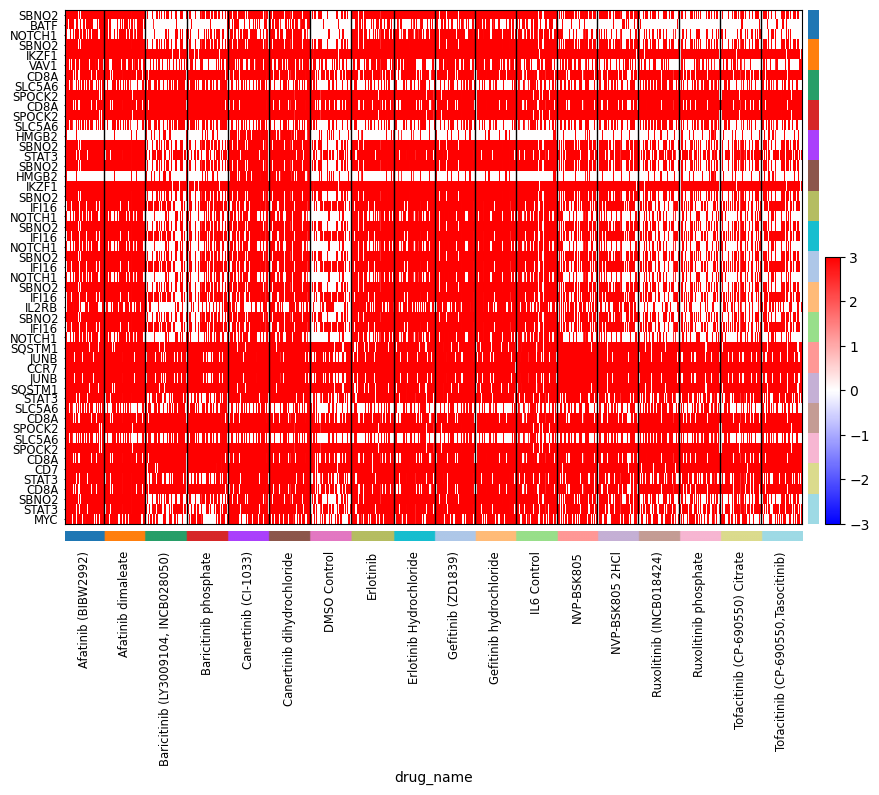

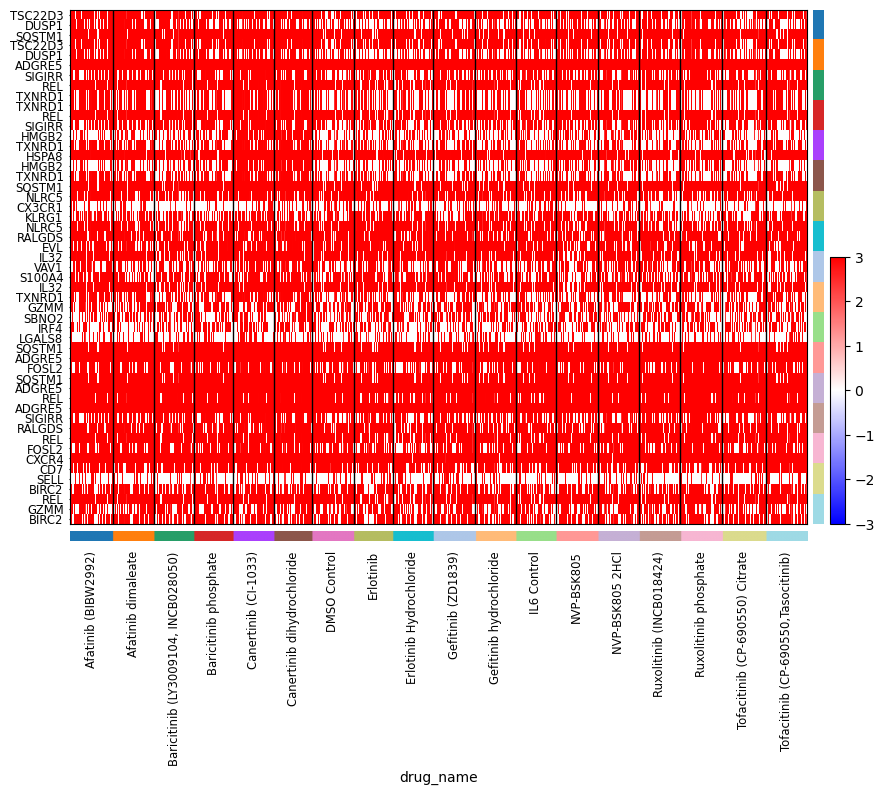

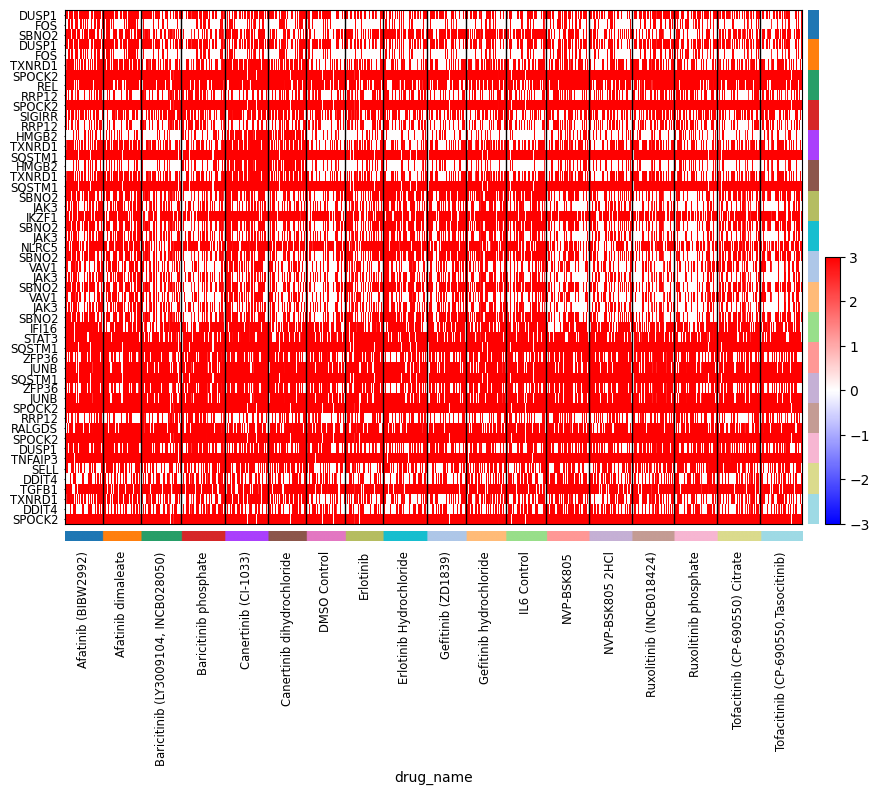

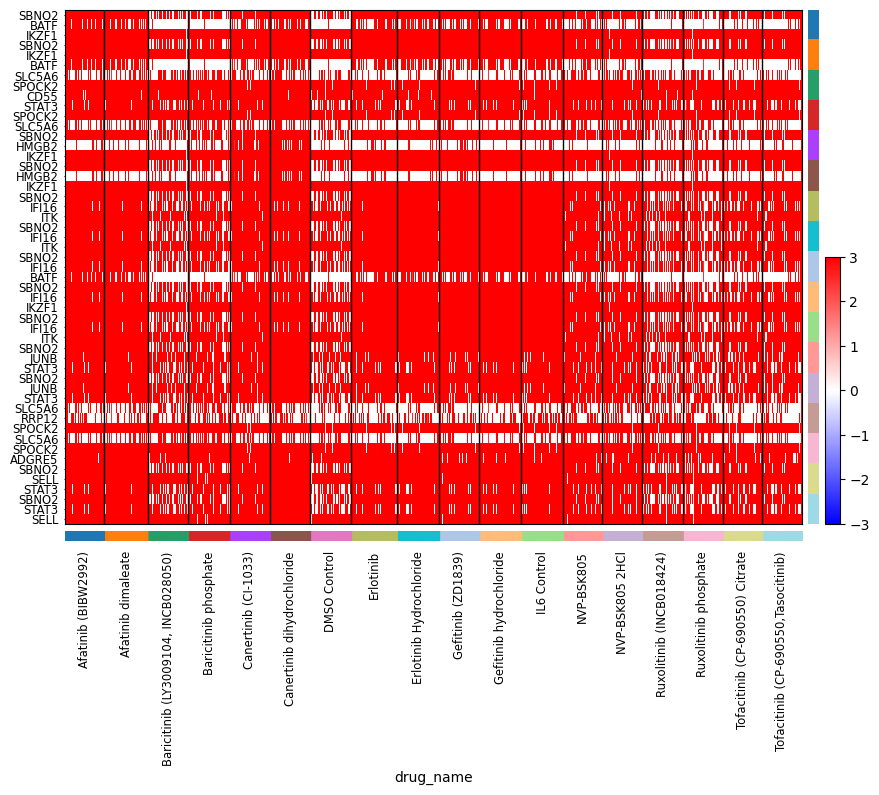

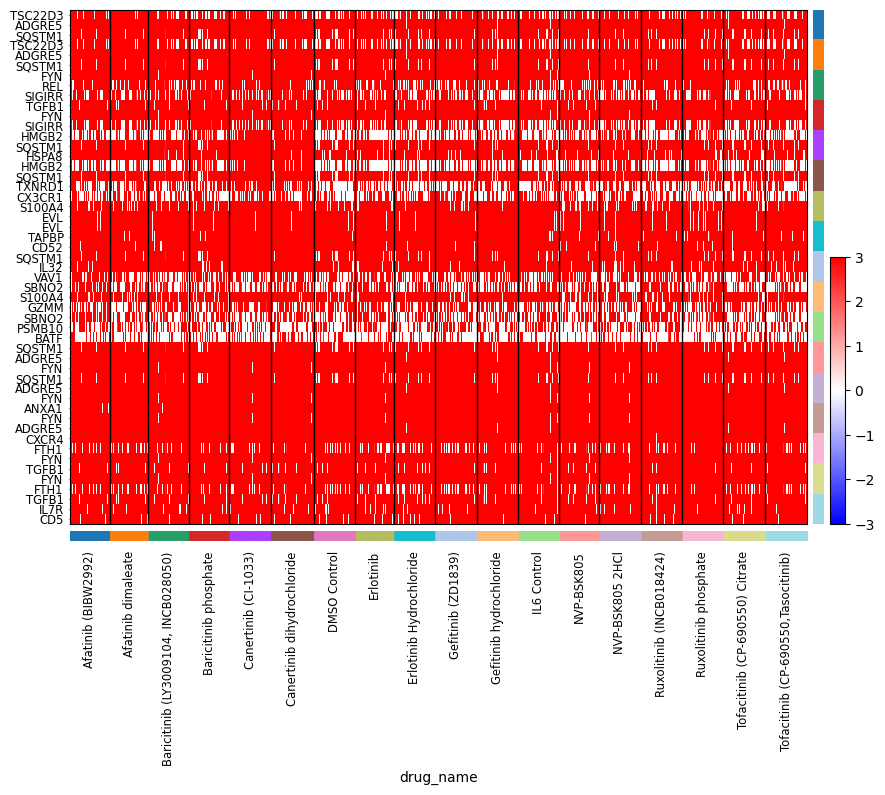

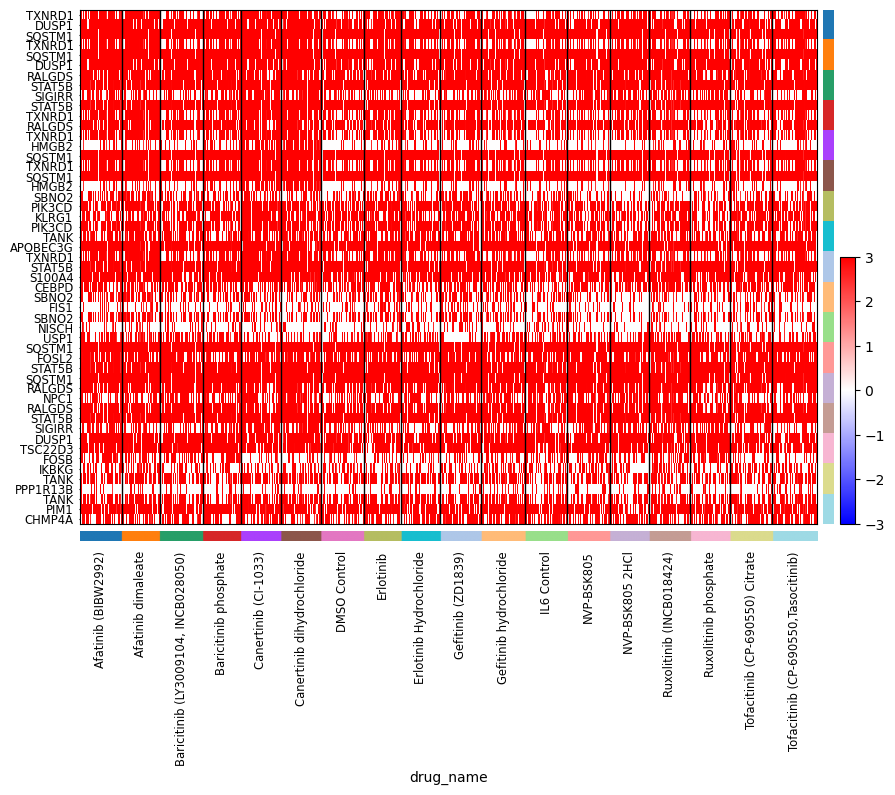

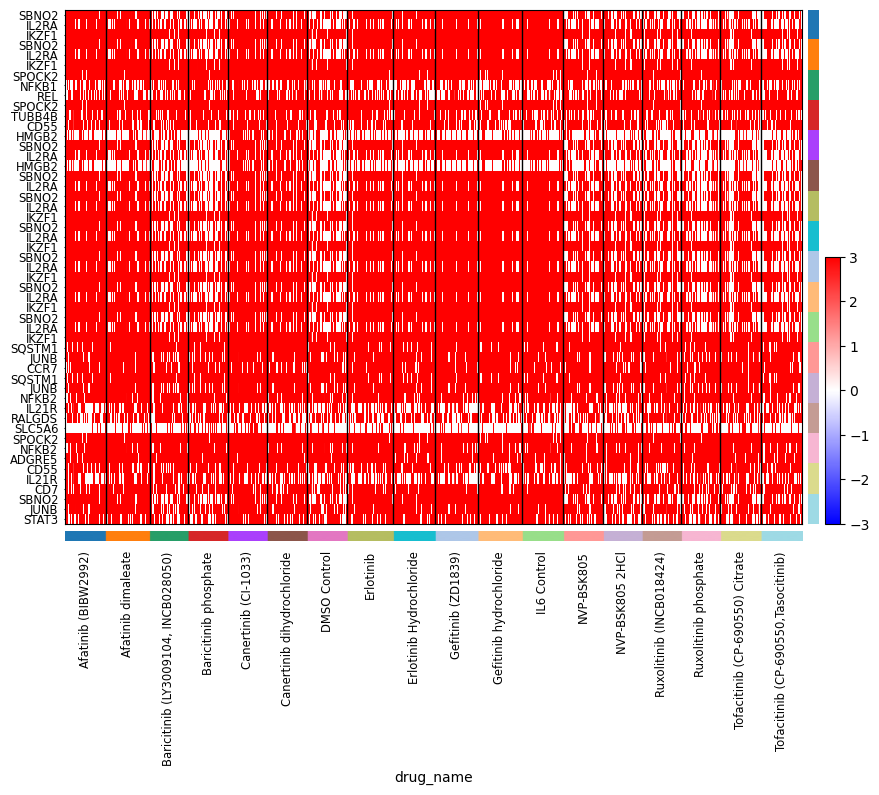

In [42]:
for cell_type, subset_cell in subsets_cells.items():    
    print(cell_type)
    sc.pl.rank_genes_groups_heatmap(
        subset_cell,
        n_genes=3,
        use_raw=False,
        swap_axes=True,
        vmin=-3,
        vmax=3,
        cmap="bwr",
        layer="log_transformed",
        show_gene_labels=True,
        figsize=(10, 7),
        show=False,
        dendrogram = False
    )

CD4 Central Memory


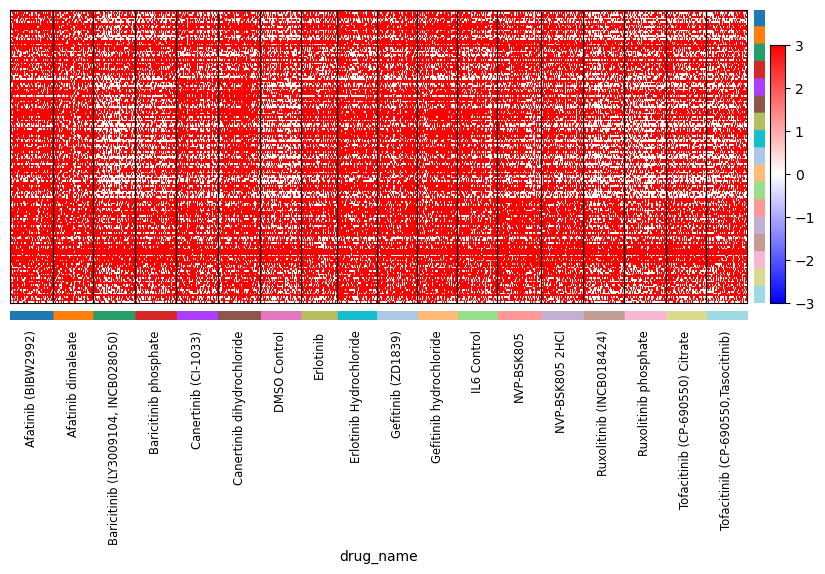

CD8 Naive


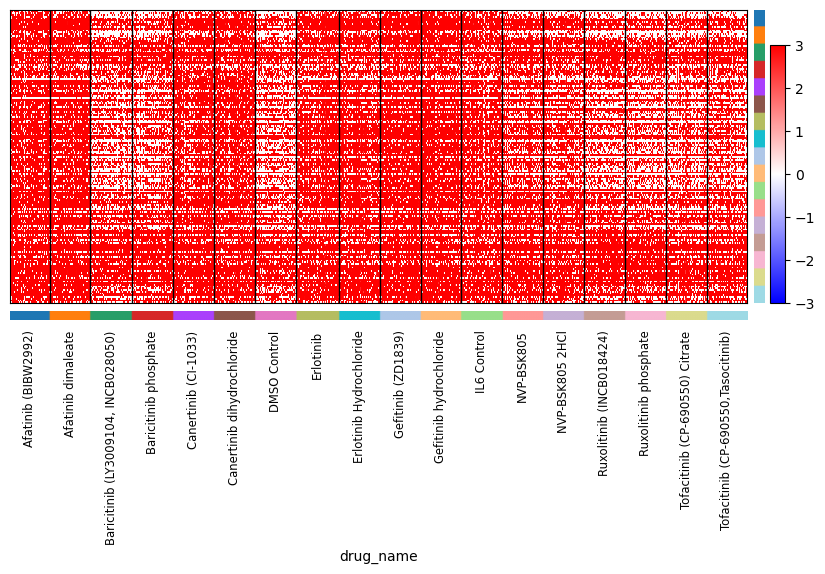

CD8 Effector Memory


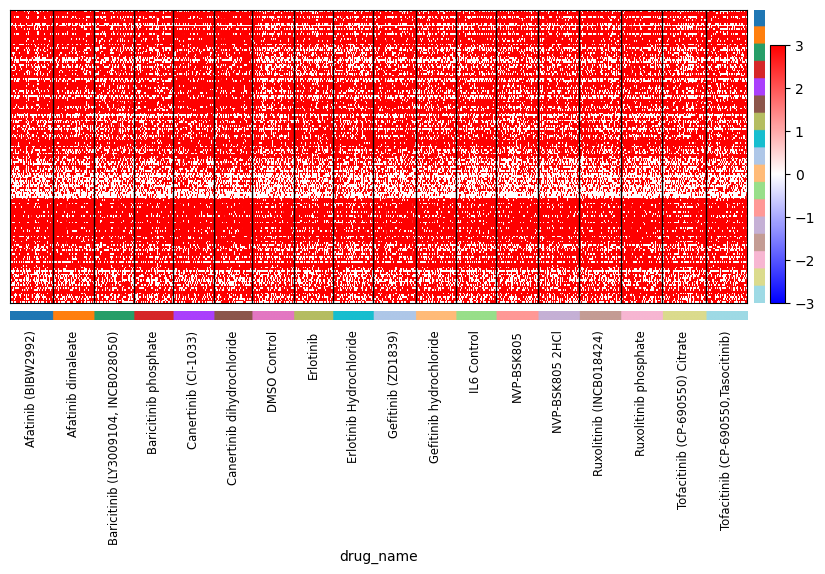

CD8 Central Memory


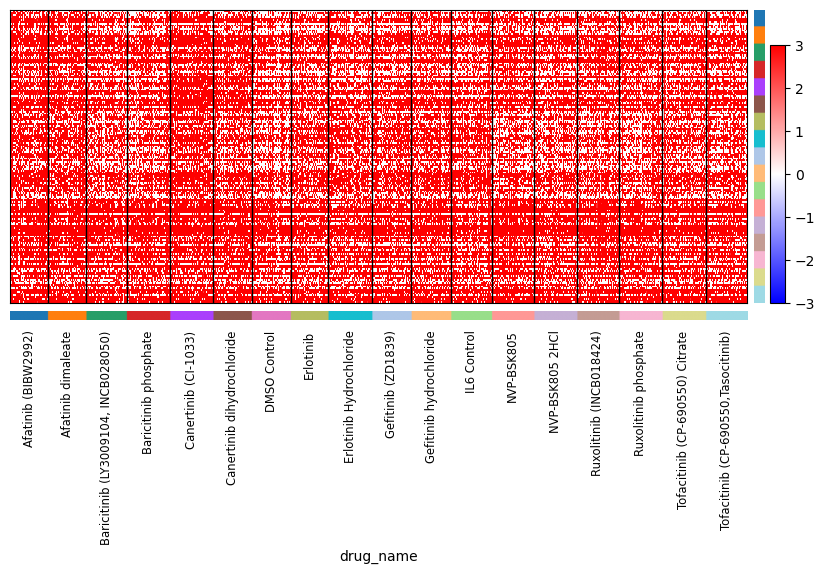

CD4 Naive


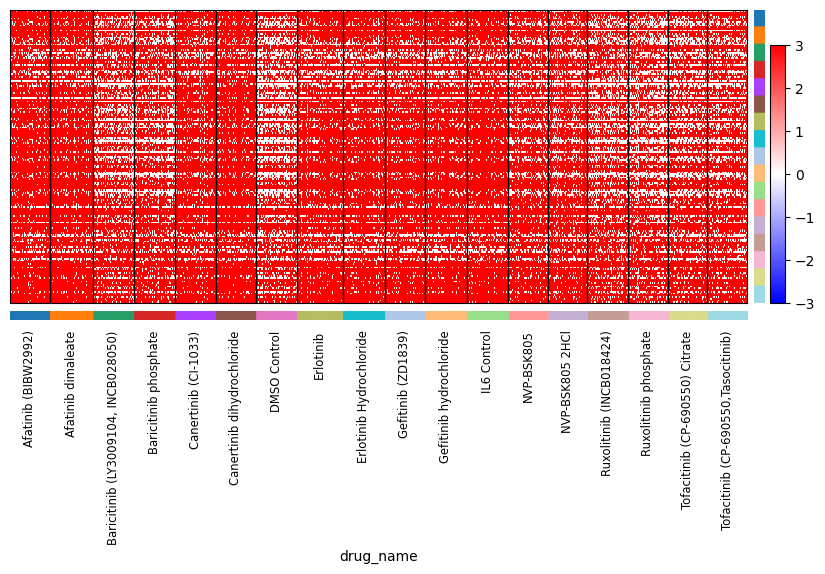

CD4 Effector Memory


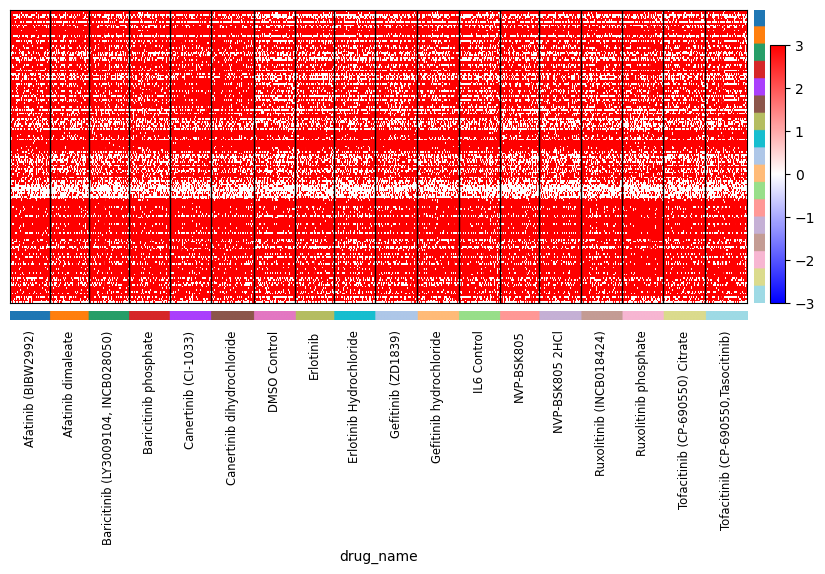

MAIT


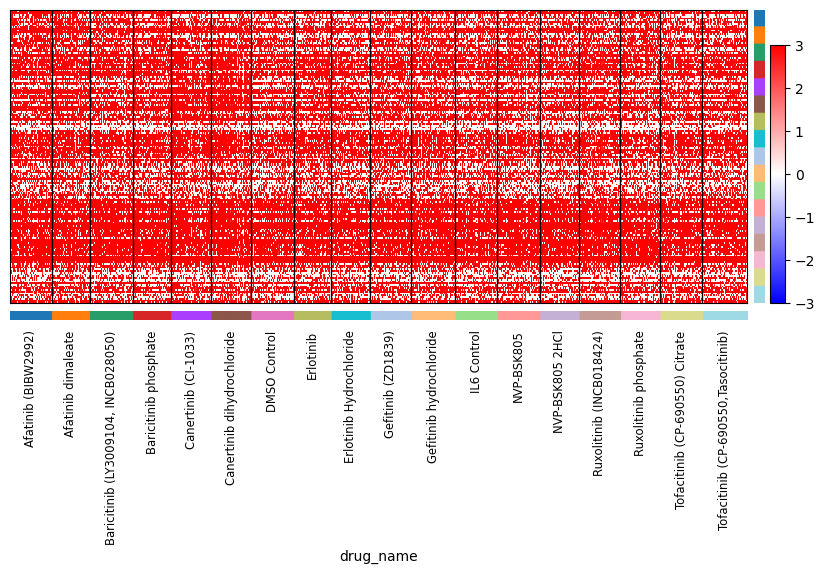

Treg


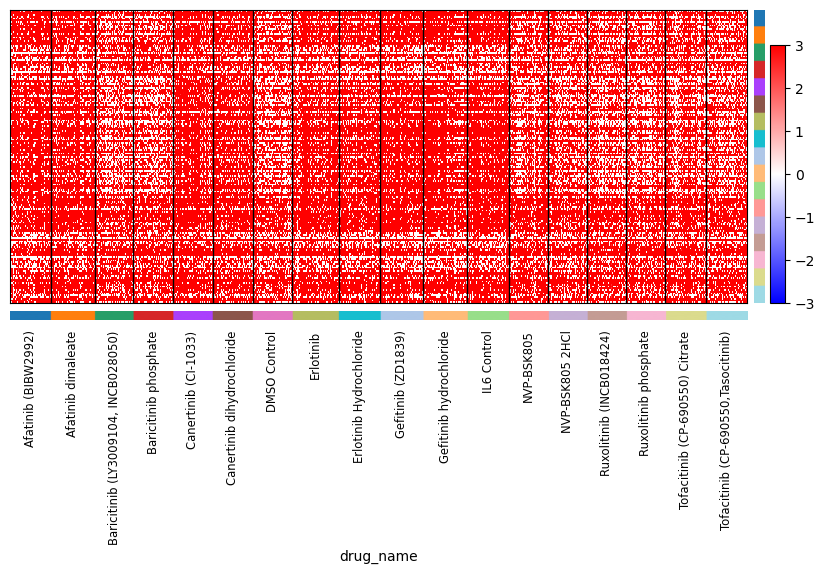

In [38]:
for cell_type, subset_cell in subsets_cells.items():    
    print(cell_type)
    sc.pl.rank_genes_groups_heatmap(
        subset_cell,
        use_raw=False,
        swap_axes=True,
        show_gene_labels=False,
        vmin=-3,
        vmax=3,
        cmap="bwr",
        dendrogram = False,
    )

## Visualize marker genes using dotplot

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="AIFI_L2", method="wilcoxon")

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4, dendrogram = False)

In [ ]:
#logfold change dot plot
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=4,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
    dendrogram = False
)

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="drug_name", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4)
#logfold change dot plot
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=4,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
    dendrogram = False
)